# Wstęp do multimediów (WMM)
### Kacper Górski, 331379



In [198]:
from matplotlib import pyplot as plt
from IPython.display import display, Markdown
import cv2
import numpy as np
import copy

In [199]:
NUM_IMAGES = 36
STUDENT_INDEX = 331379

def image_to_process(student_index, num_images):
    return student_index % num_images

print("Image index to process: ", image_to_process(STUDENT_INDEX, NUM_IMAGES))

IMAGE_PATH = ".\\color\\susie_col.png"
IMAGE_PATH_INOISE1 = ".\\color_inoise1\\susie_col_inoise.png"
IMAGE_PATH_INOISE2 = ".\\color_inoise2\\susie_col_inoise.png"
IMAGE_PATH_NOISE = ".\\color_noise\\susie_col_noise.png"

Image index to process:  35


### Obraz do przetworzenia -> susie_col.png (index: 35)

image, wymiary: (480, 720, 3), typ danych: uint8, wartości: 12 - 255


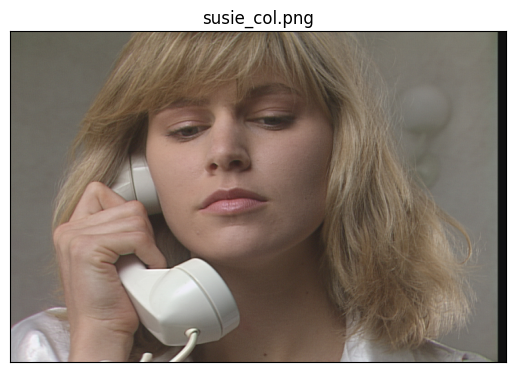

In [200]:
def load_image(path):
    image = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def plt_imshow(img, img_title="image"):
    plt.figure()
    plt.title(img_title)
    plt.imshow(img)
    plt.xticks([]), plt.yticks([])
    plt.show()

image = load_image(IMAGE_PATH)
print(f"image, wymiary: {image.shape}, typ danych: {image.dtype}, wartości: {image.min()} - {image.max()}")
plt_imshow(image, img_title=IMAGE_PATH.split("\\").pop())

# Zadanie 1

Zrealizować operację filtracji barwnego obrazu cyfrowego.   
Do realizacji zadania wykorzystać obrazy zaszumione (szumem gaussowskim oraz impulsowym).  
Każdy z obrazów wejściowych poddać przetwarzaniu filtrem wygładzającym (Gaussa) i filtrem 
medianowym. Każdy obraz wynikowy wyświetlić i obliczyć dla niego PSNR (w stosunku do obrazu 
oryginalnego, nie zaszumionego!, funkcja do obliczania PSNR dostępna jest w przykładowym 
skrypcie). Ocenić działanie filtrów dla masek o rozmiarach: 3x3, 5x5, 7x7.  
Zebrać w tabeli PSNR dla różnych rodzajów szumów, filtrów i rozmiarów maski.  
1 
Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?   
Czy ocena subiektywna uzyskanych obrazów wynikowych, jest zgodna z PSNR (lepsza jakość – 
większy PSNR)?   
Opisać wnioski w sprawozdaniu. 

In [ ]:
MASK_SIZE_3X3 = 3
MASK_SIZE_5X5 = 5
MASK_SIZE_7X7 = 7

def apply_gaussian_filter(img, size):
    return cv2.GaussianBlur(img, (size, size), 0)

def apply_median_filter(img, size):
    return cv2.medianBlur(img, size)

def calc_psnr(img1, img2):
    imax = 255.**2
    mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size
    return 10.0*np.log10(imax/mse)

def apply_filtration(img, noisy_img, filter_name, filter: callable):
    for size in MASK_SIZE_3X3, MASK_SIZE_5X5, MASK_SIZE_7X7:
        filtered_image = filter(noisy_img, size)
        psnr = calc_psnr(img, filtered_image)
        filter_title = f'{filter_name} {size}x{size}'

        plt_imshow(filtered_image, f"{filter_title} (PSNR: {psnr} dB)")

## Obraz zaszumiony szumem gaussowskim

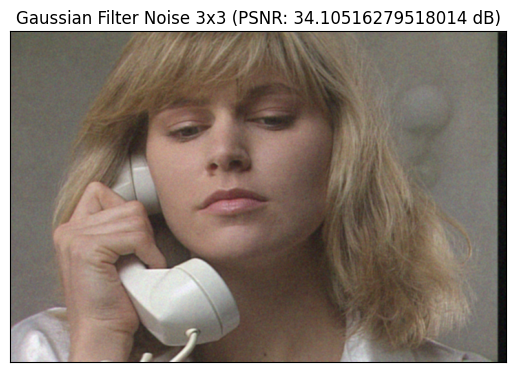

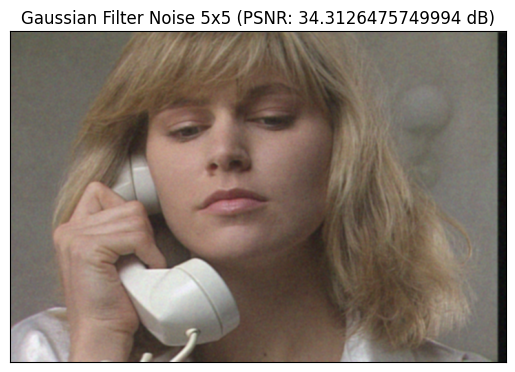

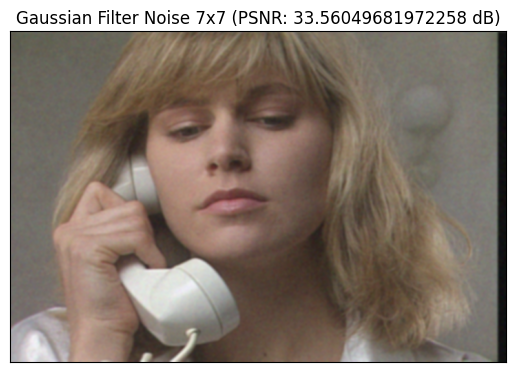

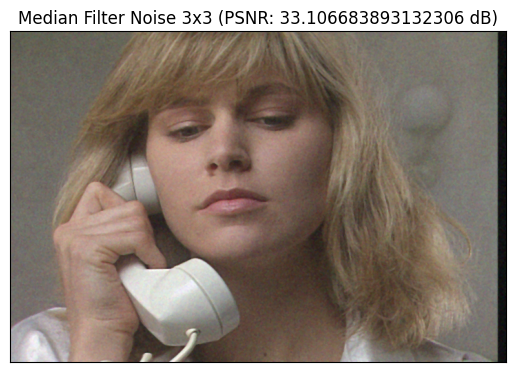

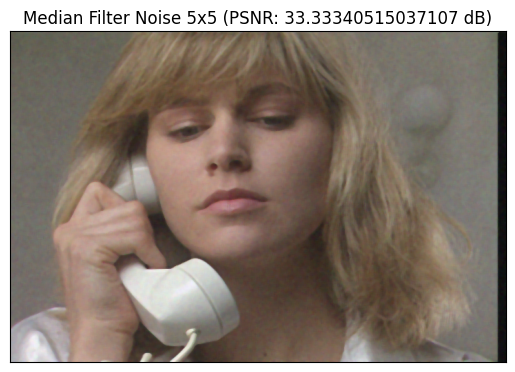

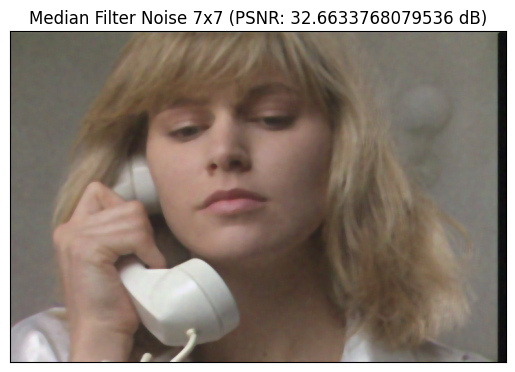

In [202]:
noisy_image = load_image(IMAGE_PATH_NOISE)

apply_filtration(image, noisy_image, "Gaussian Filter Noise", apply_gaussian_filter)

apply_filtration(image, noisy_image, "Median Filter Noise", apply_median_filter)


## Obraz zaszumiony szumem impulsowym 1

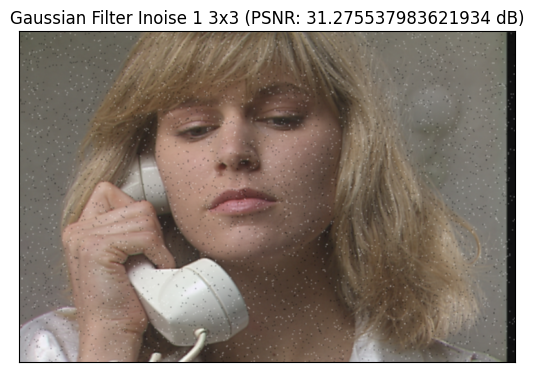

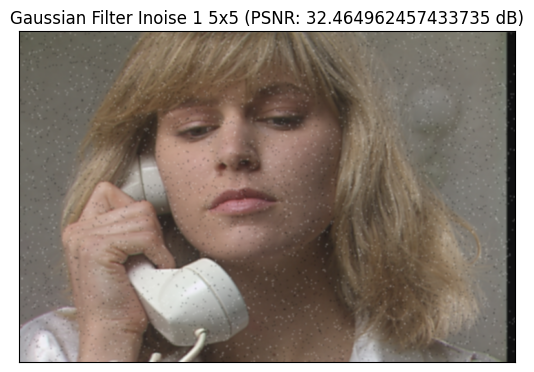

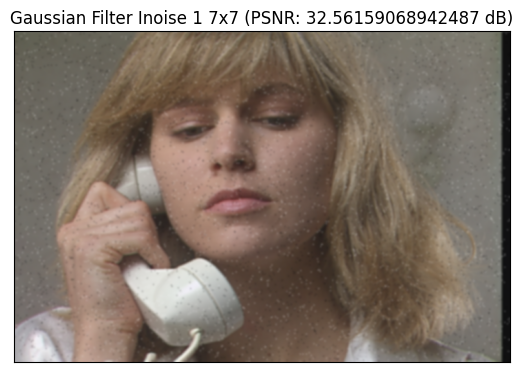

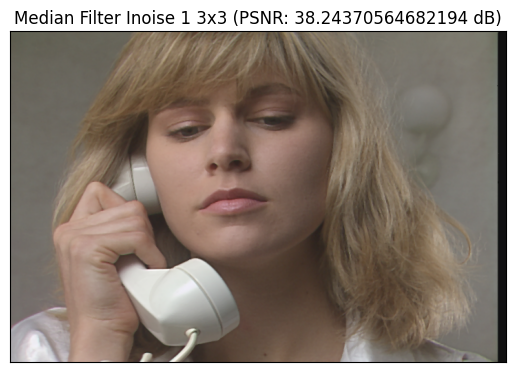

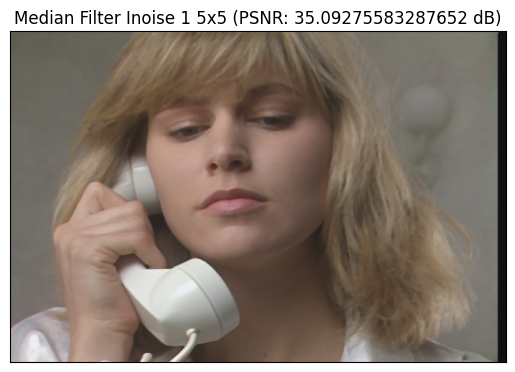

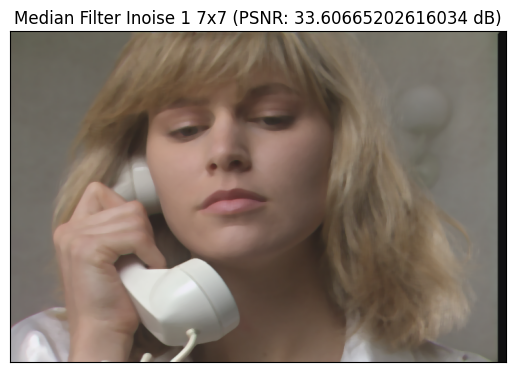

In [203]:
inoise_image_1 = load_image(IMAGE_PATH_INOISE1)

apply_filtration(image, inoise_image_1, "Gaussian Filter Inoise 1", apply_gaussian_filter)

apply_filtration(image, inoise_image_1, "Median Filter Inoise 1", apply_median_filter)

## Obraz zaszumiony szumem impulsowym 2

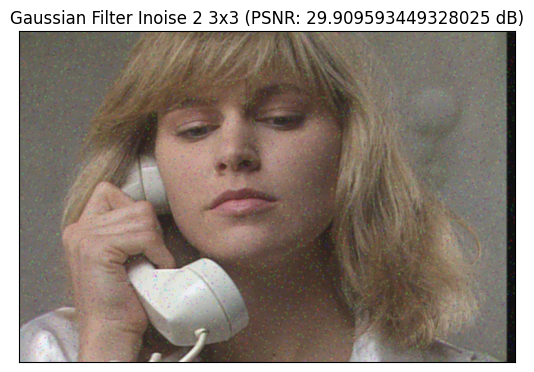

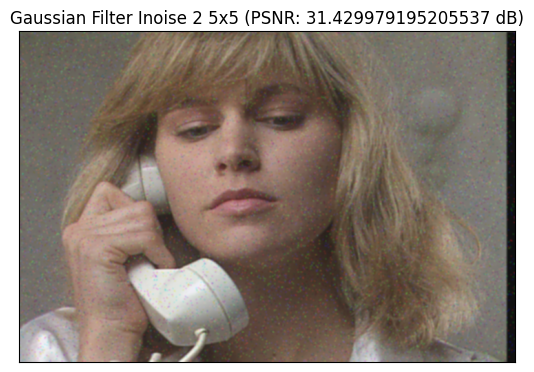

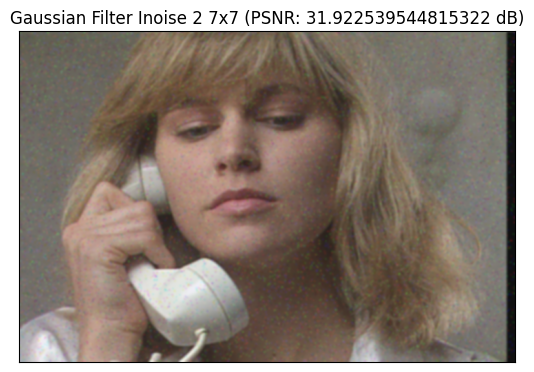

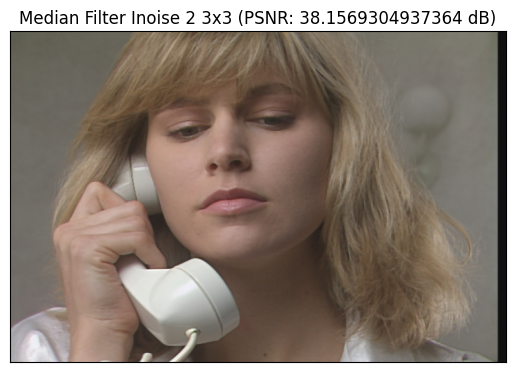

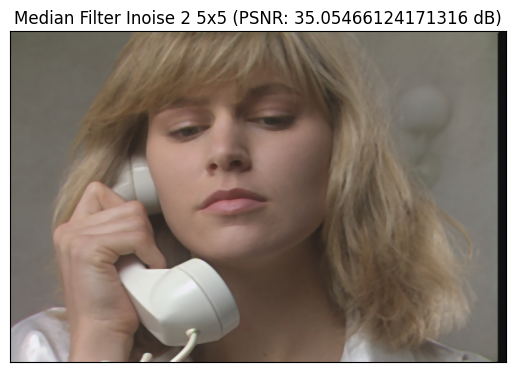

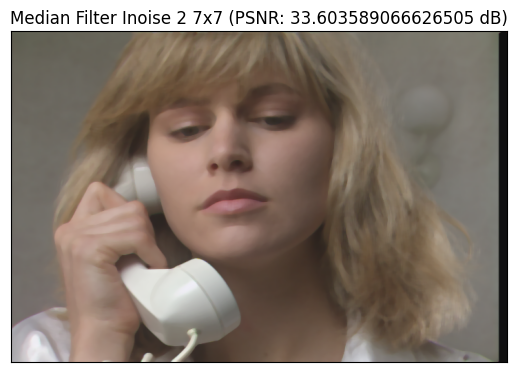

In [204]:
inoise_image_2 = load_image(IMAGE_PATH_INOISE2)

apply_filtration(image, inoise_image_2, "Gaussian Filter Inoise 2", apply_gaussian_filter)

apply_filtration(image, inoise_image_2, "Median Filter Inoise 2", apply_median_filter)

## Bez filtrów

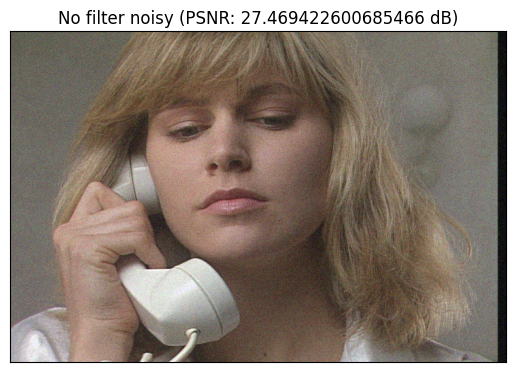

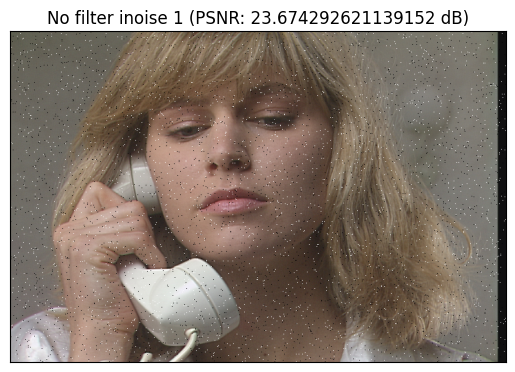

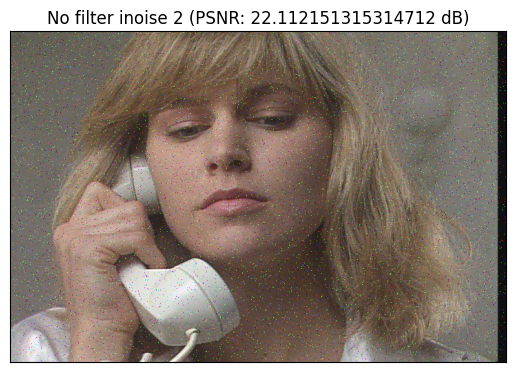

In [205]:
def no_filtration_psnr(img, noisy_img, operation_name):
    psnr = calc_psnr(img, noisy_img)
    psnrs_collected[operation_name] = psnr
    plt_imshow(noisy_img, f"{operation_name} (PSNR: {psnr} dB)")

no_filtration_psnr(image, noisy_image, 'No filter noisy')
no_filtration_psnr(image, inoise_image_1, 'No filter inoise 1')
no_filtration_psnr(image, inoise_image_2, 'No filter inoise 2')

### Brak Filtrów
| noise | inoise_1 | inoise_2 |
|-------|----------|----------|
| -     | 27.4694  | 23.6743  | 22.1122  |

### Filtr Gaussa
| noise | inoise_1 | inoise_2 |
|-------|----------|----------|
| 3x3   | 34.1052  | 31.2755  | 29.9096  |
| 5x5   | 34.3126  | 32.4650  | 31.4300  |
| 7x7   | 33.5605  | 32.5616  | 31.9225  |

### Filtr Medianowy
| noise | inoise_1 | inoise_2 |
|-------|----------|----------|
| 3x3   | 33.1067  | 38.2437  | 38.1569  |
| 5x5   | 33.3334  | 35.0928  | 35.0547  |
| 7x7   | 32.6634  | 33.6067  | 33.6036  |


### Pytania

* Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?   
    - Im większy rozmiar maski tym szumy wydają się być mniejsze
    - Im większy rozmiar maski tym wyrazistość obrazu się zmniejsza i zaczynamy tracić kontury

* Czy ocena subiektywna uzyskanych obrazów wynikowych, jest zgodna z PSNR (lepsza jakość – 
większy PSNR)?   
    - Z zebranych wyników rzeczywiście wygląda na to, że im lepsza jakość obrazu tym większy PSNR
    

### Wnioski

Rozmiar maski wpływa na kompromis między redukcją szumu a zachowaniem szczegółów. Wyższy PSNR przy większych maskach niekoniecznie oznacza lepszą jakość wizualną – zbyt duża maska może powodować nadmierne rozmycie obrazu. Dlatego ocena subiektywna (wizualna) i obiektywna (PSNR) nie zawsze idą w parze. Optymalny rozmiar maski powinien być wybrany na podstawie rodzaju szumu i pożądanego efektu wizualnego.

# Zadanie 2

Zrealizować operację wyrównania histogramu dla obrazu barwnego i zapisać obraz wynikowy do 
pliku. UWAGA: operację wyrównania histogramu należy wykonać wyłącznie dla składowej 
odpowiadającej za jasność, w tym celu należy wejściowy obraz RGB skonwertować do innej 
przestrzeni (np. YCbCr/YUV), a po wyrównaniu histogramu dla właściwej składowej powrócić do 
pierwotnego formatu.   
Porównać uzyskane obrazy i ich histogramy (w szczególności: histogram dla składowej, dla której 
wykonano operację wyrównywania histogramu).   
Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości? 

In [207]:
def create_ycrcb_image(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

def split_components(img):
    ycrcb_image = create_ycrcb_image(img)
    return cv2.split(ycrcb_image)       # y, cr, cb

def merge_with_equalized_luminosity(components):
    y, cr, cb = components
    return cv2.merge([y, cr, cb])

def equalize_ycrcb_image(img):
    components = split_components(img)
    y, cr, cb = components

    y_equalized = cv2.equalizeHist(y)
    return merge_with_equalized_luminosity((y_equalized, cr, cb))

def equalize_image(img):
    ycrcb_equalized = equalize_ycrcb_image(img)
    return cv2.cvtColor(ycrcb_equalized, cv2.COLOR_YCrCb2BGR)

def print_histogram(image):
    hist_cv = cv2.calcHist([image], [0], None, [256], [0, 256])
    hist_cv = hist_cv.flatten()
    plt.figure()
    plt.plot(hist_cv, color="blue")
    plt.xlim([0,256])

### Obraz po wyrównaniu histogramu dla składowej iluminacji
### Porównanie histogramów przed i po wyrównaniu składowej luminancji (dla zdjęć w przestrzeni BGR)

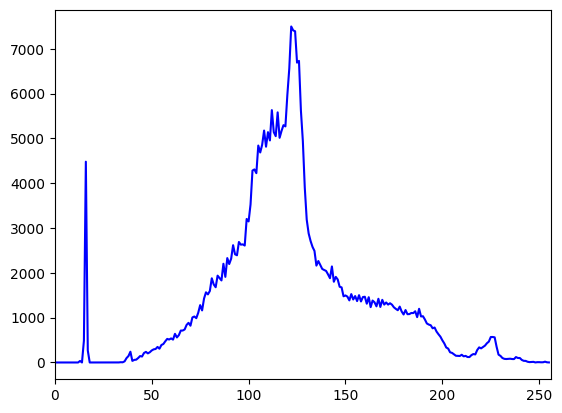

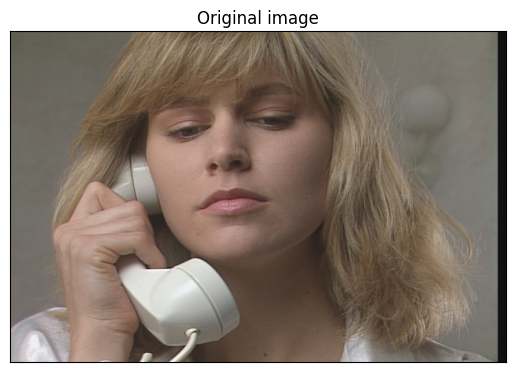

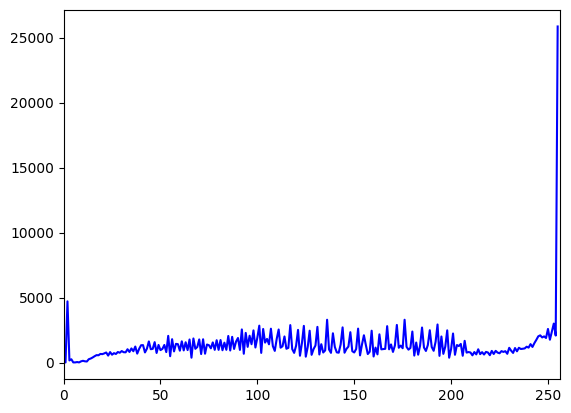

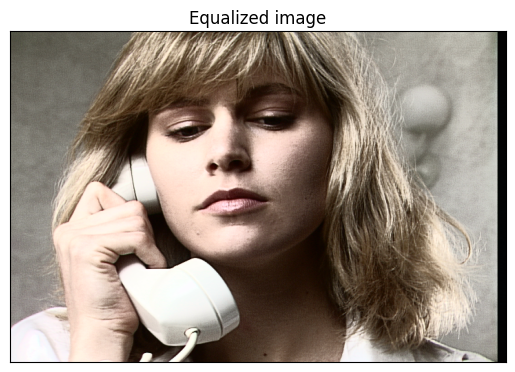

In [208]:
equalized_image = equalize_image(image)
print_histogram(image)
plt_imshow(image, "Original image")
print_histogram(equalized_image)
plt_imshow(equalized_image, "Equalized image")

### Porównanie histogramów przed i po wyrównaniu składowej luminancji  (dla zdjęć w przestrzeni YCrCb)

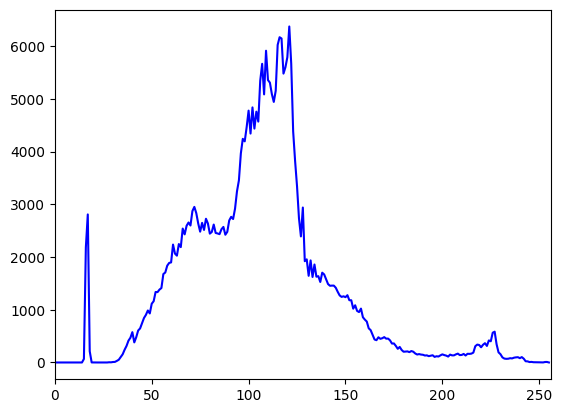

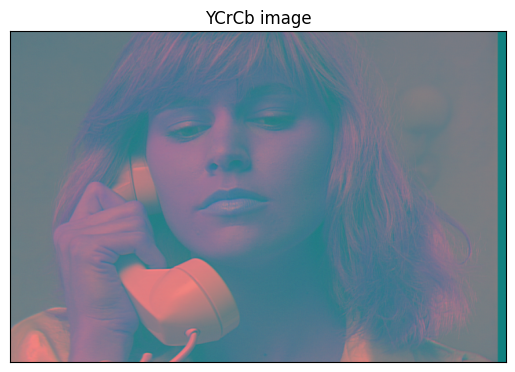

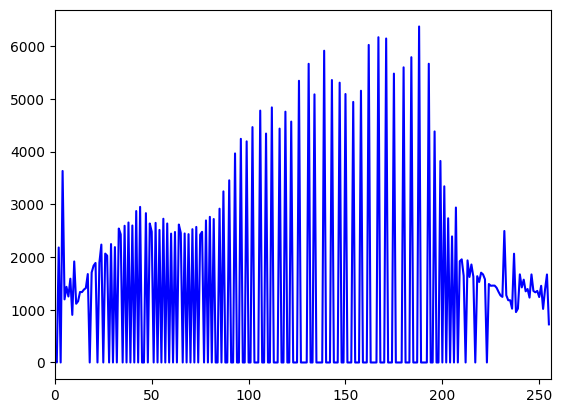

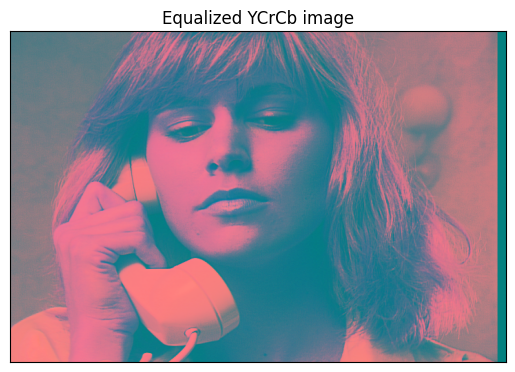

In [209]:
ycrcb_image = create_ycrcb_image(image)
equalized_ycrcb_image = equalize_ycrcb_image(image)

print_histogram(ycrcb_image)
plt_imshow(ycrcb_image, "YCrCb image")

print_histogram(equalized_ycrcb_image)
plt_imshow(equalized_ycrcb_image, "Equalized YCrCb image")

### Pytania

* Porównanie histogramów
    - **Histogram obrazu w przestrzeni BGR** pokazuje, że wartości pikseli są teraz w przybliżeniu równomiernie rozłożone na wszystkie dostępne wartości i nie są już skupione w jednym punkcie

    - **Histogram obrazu w przestrzeni YCrCb** pokazuje, że histogram nie został rozłożony na wszystkie wartości, tylko został rozszeżony. Wartości nie są skumulowane w jednym miejscu, tylko są bardziej zróżnicowane.

* Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości? 
    - Obraz nie jest subiektywnie lepszej jakości, ponieważ został nienaturalnie naświetlony, widać bardziej kontury tła, widać duży kontrast oraz obraz sam w sobie stracił głębie kolorów

# Zadanie 3

Korzystając z filtru Laplace’a do wyznaczenia wysokoczęstotliwościowych składowych obrazu 
dokonać wyostrzenia obrazu:  
``img_out = img_in + W*img_laplace.``   
Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego?   
Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki?   
Uwaga: należy pamiętać, że wyostrzanie obrazu powoduje również uwydatnienie szumu w obrazie, w 
niektórych przypadkach (niezbyt dobrej jakości obrazów oryginalnych) przydatne może być wstępne 
wygładzenie obrazu filtrem dolnoprzepustowym (np. filtrem Gaussa).  
Wskazówka: wykorzystać funkcję cv2.addWeighted() do sumowania obrazów i równoczesnej 
konwersji wyniku do 8-bitowych liczb całkowitych z przedziału [0, 255].   
Uwaga: ze względu na sposób wyliczania laplasjanu w bibliotece OpenCV w celu uzyskania 
‘dobrych’ wyników należy odjąć ‘obraz wysokoczęstotliwościowy’, czyli zastosować ujemne 
wartości wagi W. 

In [210]:
def laplace_filter(img):
    return cv2.Laplacian(img, cv2.CV_64F)

def sharpen_image(img, weights, smoothen_image: bool = False):
    process_image = copy.deepcopy(img)
    if smoothen_image: process_image = cv2.GaussianBlur(img, (3, 3), 0)

    img_laplace = laplace_filter(process_image)
    img_laplace = cv2.convertScaleAbs(img_laplace)

    img_out = cv2.addWeighted(img, 1.0, img_laplace, weights, 0)
    img_out = np.clip(img_out, 0, 255).astype(np.uint8)

    return img_out

### Obraz wyostrzony z wagami 0, 0.1, 0.3, 0.5, 1

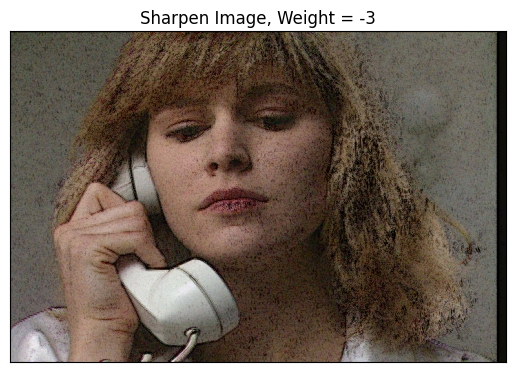

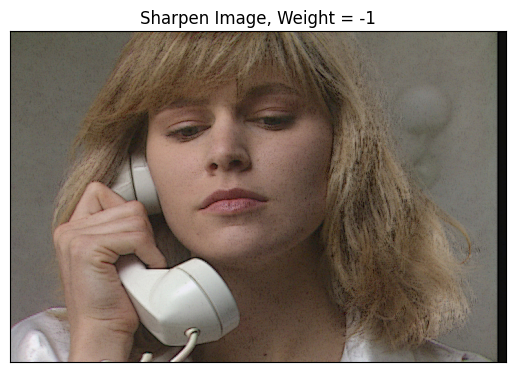

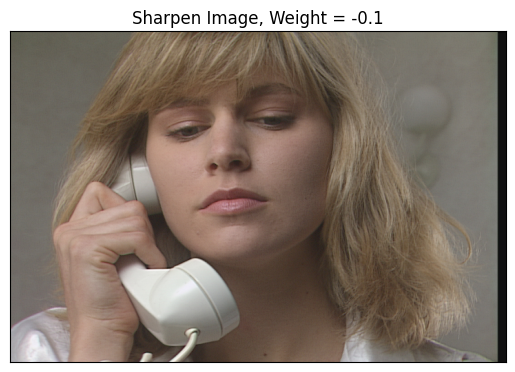

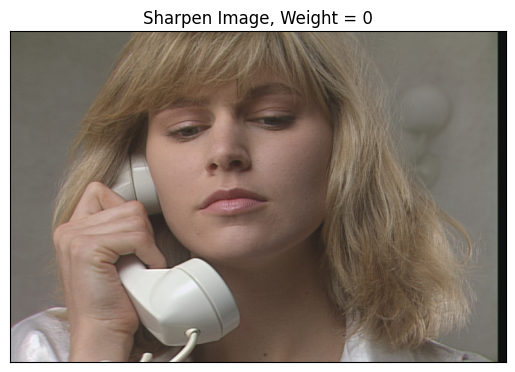

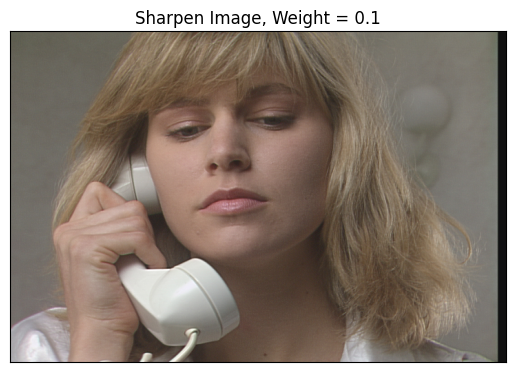

...

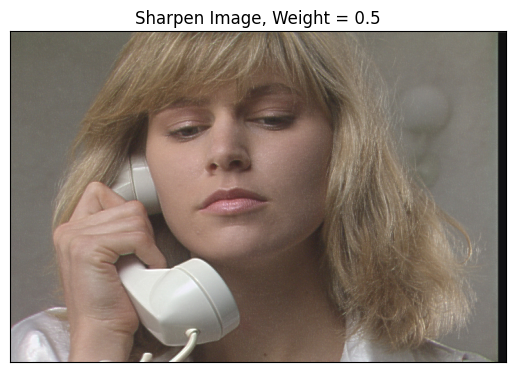

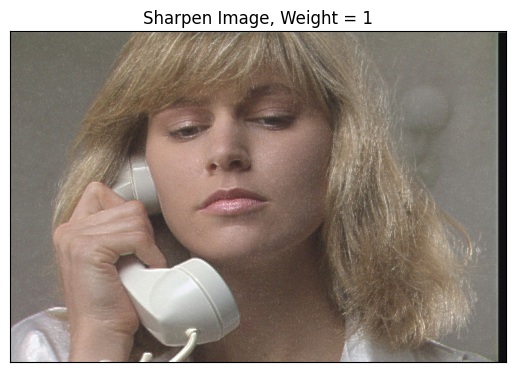

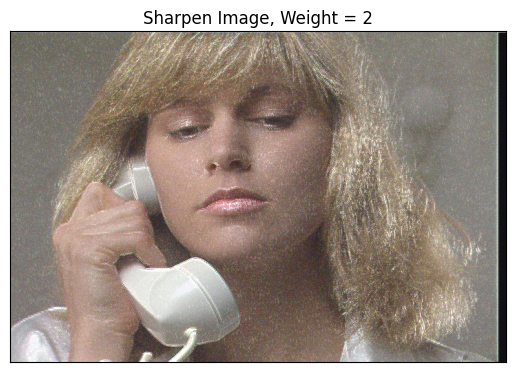

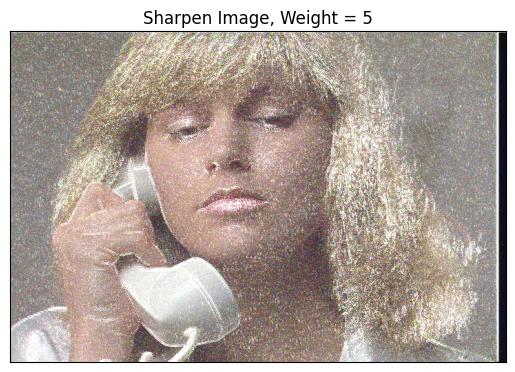

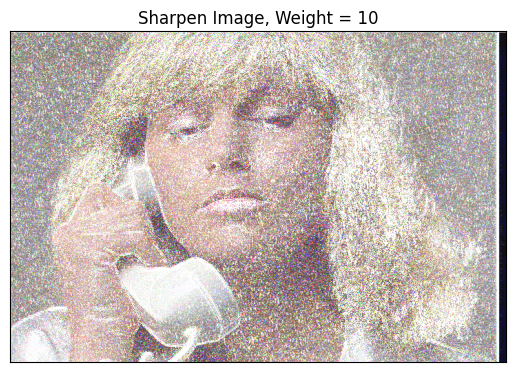

In [211]:
WEIGHTS = [-3, -1, -0.1, 0, 0.1, 0.3, 0.5, 1, 2, 5, 10]

for w in WEIGHTS:
    img_out = sharpen_image(image, w)
    plt_imshow(img_out, f"Sharpen Image, Weight = {w}")

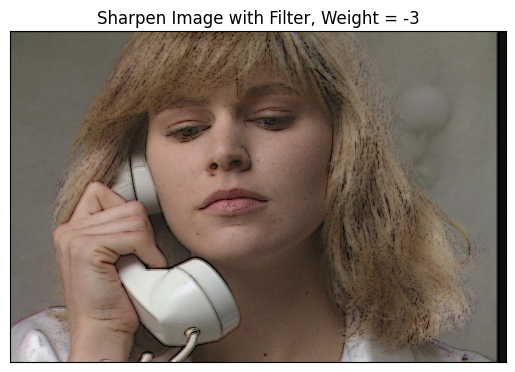

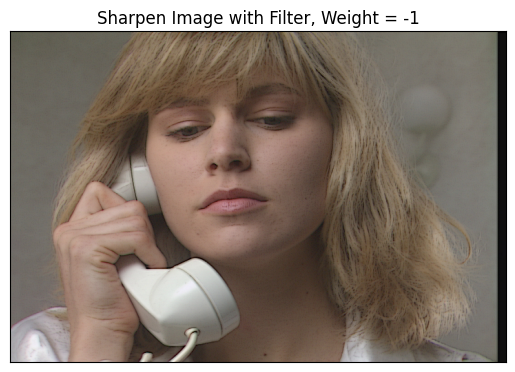

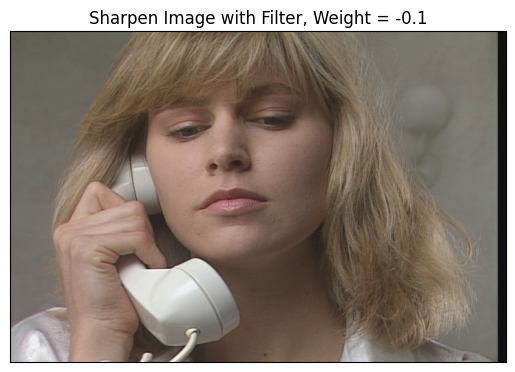

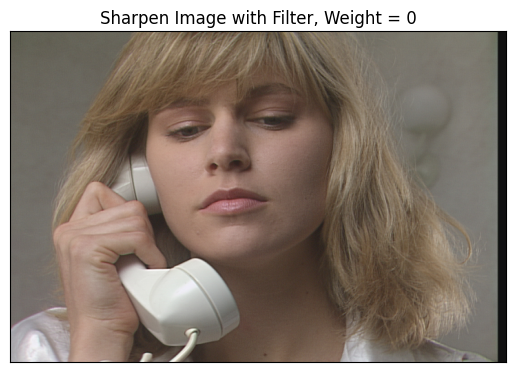

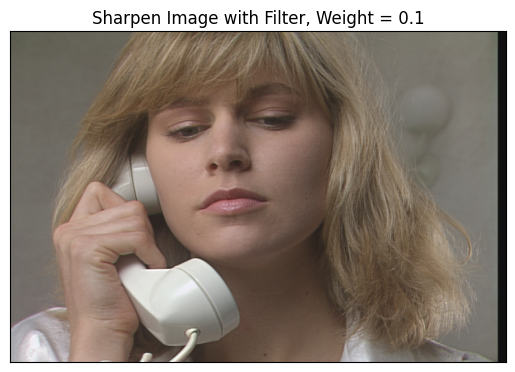

...

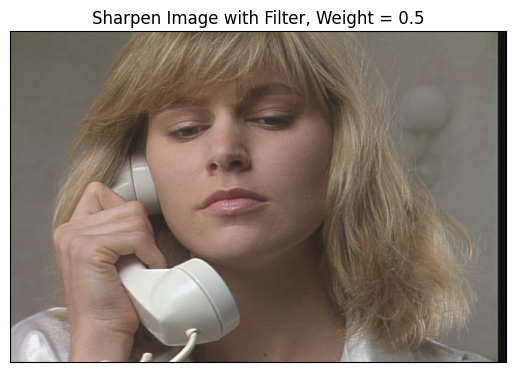

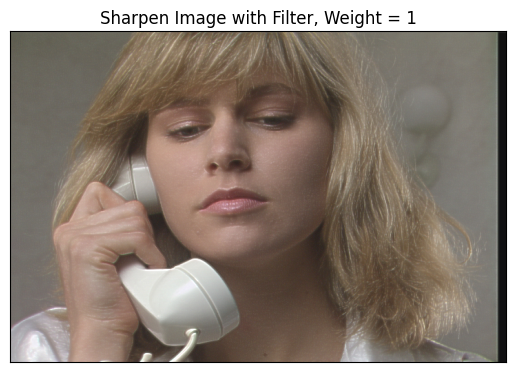

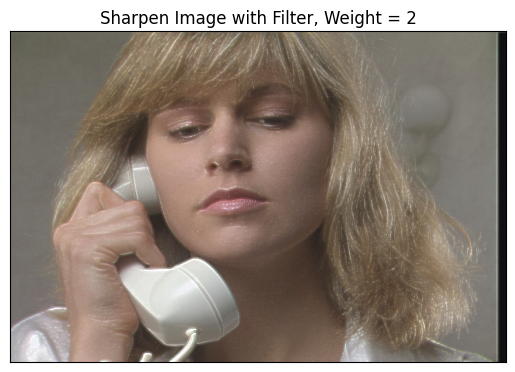

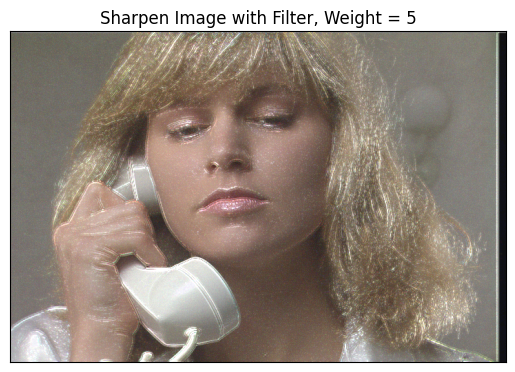

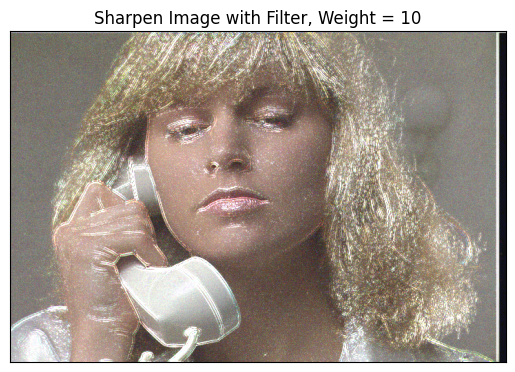

In [212]:
for w in WEIGHTS:
    img_out = sharpen_image(image, w, smoothen_image = True)
    plt_imshow(img_out, f"Sharpen Image with Filter, Weight = {w}")

### Pytania

* Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego?
    - Im większa waga składowej wysokoczęstotliwościowej tym obraz wynikowy jest bardziej wyostrzony
    - Przy ujemnej wadze obraz się rozmywa i jest "zabrudzony"
    - Przy za dużej wadze krawędzie się zbytnio uwidaczniają i występuje nieprzyjemny dla okna efekt zarysowania

* Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki?  
    - Wartości przyjemne dla oka uzyskuje się w przedziale od 0 do 2.